In [1]:
import numpy as np
import pandas as pd

from scipy.stats import mode

import warnings
warnings.filterwarnings('ignore')

In [2]:
DATASET_PATH = './train.csv'
PREPARED_DATASET_PATH = './train_prepared.csv'

In [3]:
df = pd.read_csv(DATASET_PATH)
df.head()

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price
0,11809,27,3.0,115.027311,NaN,10.0,4,10.0,2014,0.075424,B,B,11,3097,0,NaN,0,0,B,305018.871089
1,3013,22,1.0,39.832524,23.169223,8.0,7,8.0,1966,0.118537,B,B,30,6207,1,1183.0,1,0,B,177734.553407
2,8215,1,3.0,78.342215,47.671972,10.0,2,17.0,1988,0.025609,B,B,33,5261,0,240.0,3,1,B,282078.720850
3,2352,1,1.0,40.409907,NaN,1.0,10,22.0,1977,0.007122,B,B,1,264,0,NaN,0,1,B,168106.007630
4,13866,94,2.0,64.285067,38.562517,9.0,16,16.0,1972,0.282798,B,B,33,8667,2,NaN,0,6,B,343995.102962


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             10000 non-null  int64  
 1   DistrictId     10000 non-null  int64  
 2   Rooms          10000 non-null  float64
 3   Square         10000 non-null  float64
 4   LifeSquare     7887 non-null   float64
 5   KitchenSquare  10000 non-null  float64
 6   Floor          10000 non-null  int64  
 7   HouseFloor     10000 non-null  float64
 8   HouseYear      10000 non-null  int64  
 9   Ecology_1      10000 non-null  float64
 10  Ecology_2      10000 non-null  object 
 11  Ecology_3      10000 non-null  object 
 12  Social_1       10000 non-null  int64  
 13  Social_2       10000 non-null  int64  
 14  Social_3       10000 non-null  int64  
 15  Healthcare_1   5202 non-null   float64
 16  Helthcare_2    10000 non-null  int64  
 17  Shops_1        10000 non-null  int64  
 18  Shops_2

In [5]:
df.describe()

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Price
count,10000.00000,10000.000000,10000.000000,10000.000000,7887.000000,10000.000000,10000.000000,10000.000000,1.000000e+04,10000.000000,10000.000000,10000.000000,10000.000000,5202.000000,10000.000000,10000.000000,10000.000000
mean,8383.40770,50.400800,1.890500,56.315775,37.199645,6.273300,8.526700,12.609400,3.990166e+03,0.118858,24.687000,5352.157400,8.039200,1142.904460,1.319500,4.231300,214138.857399
std,4859.01902,43.587592,0.839512,21.058732,86.241209,28.560917,5.241148,6.775974,2.005003e+05,0.119025,17.532614,4006.799803,23.831875,1021.517264,1.493601,4.806341,92872.293865
min,0.00000,0.000000,0.000000,1.136859,0.370619,0.000000,1.000000,0.000000,1.910000e+03,0.000000,0.000000,168.000000,0.000000,0.000000,0.000000,0.000000,59174.778028
25%,4169.50000,20.000000,1.000000,41.774881,22.769832,1.000000,4.000000,9.000000,1.974000e+03,0.017647,6.000000,1564.000000,0.000000,350.000000,0.000000,1.000000,153872.633942
50%,8394.50000,36.000000,2.000000,52.513310,32.781260,6.000000,7.000000,13.000000,1.977000e+03,0.075424,25.000000,5285.000000,2.000000,900.000000,1.000000,3.000000,192269.644879
75%,12592.50000,75.000000,2.000000,65.900625,45.128803,9.000000,12.000000,17.000000,2.001000e+03,0.195781,36.000000,7227.000000,5.000000,1548.000000,2.000000,6.000000,249135.462171
max,16798.00000,209.000000,19.000000,641.065193,7480.592129,2014.000000,42.000000,117.000000,2.005201e+07,0.521867,74.000000,19083.000000,141.000000,4849.000000,6.000000,23.000000,633233.466570


In [6]:
df['Id'].value_counts()

2047     1
9502     1
11559    1
9510     1
13604    1
        ..
12907    1
10856    1
4711     1
6758     1
0        1
Name: Id, Length: 10000, dtype: int64

Удалим этот столбец

In [7]:
df.drop(columns='Id', inplace=True)

Посмотрим выбросы столбца Square

In [8]:
df[df['Square'] < 10]

,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price
161,45,1.0,2.954309,5.257278,1.0,3,1.0,1977,0.195781,B,B,23,5212,6,NaN,3,2,B,438005.182323
328,27,3.0,4.390331,5.610772,1.0,8,19.0,2016,0.211401,B,B,9,1892,0,NaN,0,1,B,161379.067034
1401,5,1.0,5.129222,5.549458,1.0,1,1.0,1977,0.150818,B,B,16,3433,4,2643.0,4,5,B,369472.403061
4496,34,1.0,1.988943,2.642219,1.0,21,4.0,1977,0.069753,B,B,53,13670,4,NaN,1,11,B,458378.777006
4800,38,1.0,4.502784,4.618547,1.0,28,1.0,1977,0.060753,B,B,15,2787,2,520.0,0,7,B,483283.488083
5009,27,1.0,4.633498,1.969969,1.0,18,1.0,1977,0.011654,B,B,4,915,0,NaN,0,0,B,107604.269441
7033,88,2.0,5.497061,67.628717,1.0,24,22.0,1977,0.127376,B,B,43,8429,3,NaN,3,9,B,412511.088764
7470,1,1.0,1.136859,4.525736,1.0,3,1.0,1977,0.007122,B,B,1,264,0,NaN,0,1,B,181434.825589
8572,6,1.0,2.596351,4.604943,1.0,3,25.0,2014,0.243205,B,B,5,1564,0,540.0,0,0,B,137597.601458
8805,27,1.0,4.380726,40.805837,1.0,10,17.0,2013,0.211401,B,B,9,1892,0,NaN,0,1,B,97560.720383


Заменим выбросы медианами по площади в зависимости от количества комнат

In [9]:
df.loc[(df['Square'] < 10) & (df['Rooms'] == 0), 'Square'] = df.loc[df['Rooms'] == 0, 'Square'].median()
df.loc[(df['Square'] < 10) & (df['Rooms'] == 1), 'Square'] = df.loc[df['Rooms'] == 1, 'Square'].median()
df.loc[(df['Square'] < 10) & (df['Rooms'] == 2), 'Square'] = df.loc[df['Rooms'] == 2, 'Square'].median()
df.loc[(df['Square'] < 10) & (df['Rooms'] == 3), 'Square'] = df.loc[df['Rooms'] == 3, 'Square'].median()

Создадим 2 вспомогательных признака о наличии пропусков в столбцах Life_Square и Healthcare 1, а также заполним пропуски в столбцах медианными значениями

In [10]:
df['LifeSquareNan'] = 0
df['Healthcare_1_Nan'] = 0
df.loc[df['LifeSquare'].isna(), 'LifeSquareNan'] = 1
df.loc[df['Healthcare_1'].isna(), 'Healthcare_1_Nan'] = 1

In [11]:
tmp = df['LifeSquare'] / df['Square']
median = tmp.median()
df['LifeSquare'].fillna(median * df['Square'], inplace=True)
df['Healthcare_1'].fillna(df['Healthcare_1'].median(), inplace=True)

Создадим новый признак - отношение жилой площади к общей

In [12]:
df['LifeSquare_per_Square'] = df['LifeSquare'] / df['Square']
df['LifeSquare_per_Square'].describe()

count    10000.000000
mean         0.650923
std          0.927808
min          0.006001
25%          0.574773
50%          0.617384
75%          0.667856
max         91.567973
Name: LifeSquare_per_Square, dtype: float64

Обработаем выбросы в LifeSquare через новый признак - заменим значения, где жилая площадь больше общей или меньше квантиля в 5%, на медиану нового признака, умноженного на площадь квартиры.

In [13]:
df.loc[(df['LifeSquare_per_Square'] > 1) | 
       (df['LifeSquare_per_Square'] < np.quantile(df['LifeSquare_per_Square'], 0.05)), 
       'LifeSquare'] = df['LifeSquare_per_Square'].median() * df['Square']

In [14]:
df['LifeSquare_per_Square'] = df['LifeSquare'] / df['Square']
df['LifeSquare_per_Square'].describe()

count    10000.000000
mean         0.638083
std          0.107724
min          0.460240
25%          0.590344
50%          0.617384
75%          0.648900
max          0.999949
Name: LifeSquare_per_Square, dtype: float64

In [15]:
df[['Square', 'LifeSquare', 'LifeSquare_per_Square']].describe()

,Square,LifeSquare,LifeSquare_per_Square
count,10000.000000,10000.000000,10000.000000
mean,56.371275,36.205760,0.638083
std,20.986723,16.236215,0.107724
min,13.784865,8.510549,0.460240
25%,41.783182,25.228923,0.590344
50%,52.537977,33.126086,0.617384
75%,65.912854,44.051570,0.648900
max,641.065193,638.163193,0.999949


Выберем выбросы в площади кухни - она должна быть меньше общей и жилой площади. Заполним выбросы медианными значениямии в зависимости от количества комнат

In [16]:
df[(df['KitchenSquare'] > df['Square']) | (df['KitchenSquare'] > df['LifeSquare'])]

,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,...,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price,LifeSquareNan,Healthcare_1_Nan,LifeSquare_per_Square
286,27,3.0,123.430072,76.203695,123.0,5,10.0,2015,0.017647,B,...,469,0,900.0,0,0,B,234194.837047,0,1,0.617384
682,52,2.0,64.859242,40.043028,62.0,15,17.0,1977,0.371149,B,...,7065,1,750.0,2,5,B,185993.474671,1,0,0.617384
755,10,1.0,35.813564,19.953992,35.0,6,14.0,1971,0.282798,B,...,8667,2,900.0,0,6,B,164306.314182,0,1,0.557163
1728,2,3.0,79.722243,44.731219,72.0,12,16.0,1987,0.130618,B,...,10418,9,900.0,1,9,B,370148.625285,0,0,0.561088
2454,72,3.0,97.490674,60.189137,96.0,22,25.0,2019,0.210473,B,...,2398,2,1994.0,3,0,B,445074.956552,0,0,0.617384
2702,6,1.0,48.128114,45.023531,48.0,21,1.0,2013,0.243205,B,...,1564,0,540.0,0,0,B,146950.912410,0,0,0.935493
2785,27,1.0,38.220258,18.716856,84.0,4,17.0,2018,0.011654,B,...,915,0,900.0,0,0,B,99079.960518,0,1,0.489710
3228,48,1.0,42.069359,22.487739,39.0,1,10.0,2010,0.041125,B,...,9515,5,900.0,1,10,B,200021.835127,0,1,0.534540
3240,27,2.0,68.841073,64.234956,66.0,4,2.0,2014,0.017647,B,...,469,0,900.0,0,0,B,189244.249909,0,1,0.933091
3586,23,2.0,51.440463,31.758495,51.0,3,17.0,2017,0.005767,B,...,388,0,900.0,0,0,B,88150.012510,0,1,0.617384


In [17]:
df.loc[((df['KitchenSquare'] > df['Square']) | (df['KitchenSquare'] > df['LifeSquare'])) &
       (df['Rooms'] == 1), 
       'KitchenSquare'] = df.loc[df['Rooms'] == 1, 'KitchenSquare'].median()
df.loc[((df['KitchenSquare'] > df['Square']) | (df['KitchenSquare'] > df['LifeSquare'])) &
       (df['Rooms'] == 2), 
       'KitchenSquare'] = df.loc[df['Rooms'] == 2, 'KitchenSquare'].median()
df.loc[((df['KitchenSquare'] > df['Square']) | (df['KitchenSquare'] > df['LifeSquare'])) &
       (df['Rooms'] == 3), 
       'KitchenSquare'] = df.loc[df['Rooms'] == 3, 'KitchenSquare'].median()
df['KitchenSquare'].describe()

count    10000.000000
mean         5.767800
std          4.456509
min          0.000000
25%          1.000000
50%          6.000000
75%          9.000000
max        112.000000
Name: KitchenSquare, dtype: float64

In [18]:
df[['Square', 'LifeSquare', 'KitchenSquare']].describe()

,Square,LifeSquare,KitchenSquare
count,10000.000000,10000.000000,10000.000000
mean,56.371275,36.205760,5.767800
std,20.986723,16.236215,4.456509
min,13.784865,8.510549,0.000000
25%,41.783182,25.228923,1.000000
50%,52.537977,33.126086,6.000000
75%,65.912854,44.051570,9.000000
max,641.065193,638.163193,112.000000


Посмотрим на столбцы этаж и и этажность дома. Заполним медианными значениями строки, где этажность дома равна нулю и где этаж квартиры больше этажности дома.

In [19]:
df.loc[df['HouseFloor'] - df['Floor'] < 0, 'HouseFloor'] = df['HouseFloor'].median()
df.loc[df['HouseFloor'] - df['Floor'] < 0, 'Floor'] = df['Floor'].median()

In [20]:
df.loc[df['Floor'] > df['HouseFloor'], 'Floor']

Series([], Name: Floor, dtype: int64)

In [21]:
df.describe()

,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Price,LifeSquareNan,Healthcare_1_Nan,LifeSquare_per_Square
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,1.000000e+04,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,50.400800,1.890500,56.371275,36.205760,5.767800,7.925300,13.853100,3.990166e+03,0.118858,24.687000,5352.157400,8.039200,1026.358900,1.319500,4.231300,214138.857399,0.211300,0.479800,0.638083
std,43.587592,0.839512,20.986723,16.236215,4.456509,4.655307,5.439566,2.005003e+05,0.119025,17.532614,4006.799803,23.831875,746.662828,1.493601,4.806341,92872.293865,0.408251,0.499617,0.107724
min,0.000000,0.000000,13.784865,8.510549,0.000000,1.000000,1.000000,1.910000e+03,0.000000,0.000000,168.000000,0.000000,0.000000,0.000000,0.000000,59174.778028,0.000000,0.000000,0.460240
25%,20.000000,1.000000,41.783182,25.228923,1.000000,4.000000,10.000000,1.974000e+03,0.017647,6.000000,1564.000000,0.000000,830.000000,0.000000,1.000000,153872.633942,0.000000,0.000000,0.590344
50%,36.000000,2.000000,52.537977,33.126086,6.000000,7.000000,13.000000,1.977000e+03,0.075424,25.000000,5285.000000,2.000000,900.000000,1.000000,3.000000,192269.644879,0.000000,0.000000,0.617384
75%,75.000000,2.000000,65.912854,44.051570,9.000000,11.000000,17.000000,2.001000e+03,0.195781,36.000000,7227.000000,5.000000,990.000000,2.000000,6.000000,249135.462171,0.000000,1.000000,0.648900
max,209.000000,19.000000,641.065193,638.163193,112.000000,42.000000,117.000000,2.005201e+07,0.521867,74.000000,19083.000000,141.000000,4849.000000,6.000000,23.000000,633233.466570,1.000000,1.000000,0.999949


Отфильтруем выбросы в столбце HouseYear

In [22]:
df[df['HouseYear'] > 2021]

,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,...,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price,LifeSquareNan,Healthcare_1_Nan,LifeSquare_per_Square
8828,147,2.0,44.791836,28.360393,5.0,4,9.0,4968,0.319809,B,...,4756,16,2857.0,5,8,B,243028.603096,0,0,0.633160
9163,109,1.0,37.265070,20.239714,9.0,9,12.0,20052011,0.136330,B,...,6141,10,262.0,3,6,B,254084.534396,0,0,0.543128


In [23]:
df.loc[df['HouseYear'] == 4968, 'HouseYear'] = df['HouseYear'].median()
df.loc[df['HouseYear'] == 20052011, 'HouseYear'] = (2005 + 2011) / 2

Отфильтруем оставшиеся количественные признаки по 2.5% квантилю

In [24]:
df.loc[(df['Ecology_1'] < np.quantile(df['Ecology_1'], 0.025)) |
      (df['Ecology_1'] > np.quantile(df['Ecology_1'], 0.975)), 
      'Ecology_1'] = df['Ecology_1'].median()

In [25]:
df.loc[(df['Social_2'] < np.quantile(df['Social_2'], 0.025)) |
      (df['Social_2'] > np.quantile(df['Social_2'], 0.975)), 
      'Social_2'] = df['Social_2'].median()

In [26]:
df.loc[(df['Social_1'] < np.quantile(df['Social_1'], 0.025)) |
      (df['Social_1'] > np.quantile(df['Social_1'], 0.975)), 
      'Social_1'] = df['Social_1'].median()

In [27]:
df.loc[(df['Social_3'] < np.quantile(df['Social_3'], 0.025)) |
      (df['Social_3'] > np.quantile(df['Social_3'], 0.975)), 
      'Social_3'] = df['Social_3'].median()

In [28]:
df.loc[(df['Healthcare_1'] < np.quantile(df['Healthcare_1'], 0.025)) |
      (df['Healthcare_1'] > np.quantile(df['Healthcare_1'], 0.975)), 
      'Healthcare_1'] = df['Healthcare_1'].median()

In [29]:
df.loc[(df['Helthcare_2'] < np.quantile(df['Helthcare_2'], 0.025)) |
      (df['Helthcare_2'] > np.quantile(df['Helthcare_2'], 0.975)), 
      'Helthcare_2'] = df['Helthcare_2'].median()

In [30]:
df.loc[(df['Shops_1'] < np.quantile(df['Shops_1'], 0.025)) |
      (df['Shops_1'] > np.quantile(df['Shops_1'], 0.975)), 
      'Shops_1'] = df['Shops_1'].median()

In [31]:
df.describe()

,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Price,LifeSquareNan,Healthcare_1_Nan,LifeSquare_per_Square
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,50.400800,1.890500,56.371275,36.205760,5.767800,7.925300,13.853100,1984.866900,0.112454,24.327100,5212.14450,4.633700,954.963400,1.270000,3.741300,214138.857399,0.211300,0.479800,0.638083
std,43.587592,0.839512,20.986723,16.236215,4.456509,4.655307,5.439566,18.411265,0.109964,15.881188,3489.46939,11.139342,571.914355,1.418627,3.777115,92872.293865,0.408251,0.499617,0.107724
min,0.000000,0.000000,13.784865,8.510549,0.000000,1.000000,1.000000,1910.000000,0.000000,1.000000,264.00000,0.000000,30.000000,0.000000,0.000000,59174.778028,0.000000,0.000000,0.460240
25%,20.000000,1.000000,41.783182,25.228923,1.000000,4.000000,10.000000,1974.000000,0.017647,9.000000,1892.00000,0.000000,830.000000,0.000000,1.000000,153872.633942,0.000000,0.000000,0.590344
50%,36.000000,2.000000,52.537977,33.126086,6.000000,7.000000,13.000000,1977.000000,0.075424,25.000000,5285.00000,2.000000,900.000000,1.000000,3.000000,192269.644879,0.000000,0.000000,0.617384
75%,75.000000,2.000000,65.912854,44.051570,9.000000,11.000000,17.000000,2001.000000,0.188784,35.000000,7065.00000,4.000000,900.000000,2.000000,5.000000,249135.462171,0.000000,1.000000,0.648900
max,209.000000,19.000000,641.065193,638.163193,112.000000,42.000000,117.000000,2020.000000,0.437885,66.000000,14892.00000,93.000000,3300.000000,5.000000,19.000000,633233.466570,1.000000,1.000000,0.999949


Посмотрим категориальные переменные

In [32]:
df['Ecology_2'].value_counts()

B    9903
A      97
Name: Ecology_2, dtype: int64

In [33]:
df['Ecology_3'].value_counts()

B    9725
A     275
Name: Ecology_3, dtype: int64

In [34]:
df['Shops_2'].value_counts()

B    9175
A     825
Name: Shops_2, dtype: int64

In [35]:
df['Ecology_2_bin'] = 0
df.loc[df['Ecology_2'] == 'A', 'Ecology_2_bin'] = 1
df.drop('Ecology_2', axis=1, inplace=True)

In [36]:
df['Ecology_3_bin'] = 0
df.loc[df['Ecology_3'] == 'A', 'Ecology_3_bin'] = 1
df.drop('Ecology_3', axis=1, inplace=True)

In [37]:
df['Shops_2_bin'] = 0
df.loc[df['Shops_2'] == 'A', 'Shops_2_bin'] = 1
df.drop('Shops_2', axis=1, inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 22 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   DistrictId             10000 non-null  int64  
 1   Rooms                  10000 non-null  float64
 2   Square                 10000 non-null  float64
 3   LifeSquare             10000 non-null  float64
 4   KitchenSquare          10000 non-null  float64
 5   Floor                  10000 non-null  int64  
 6   HouseFloor             10000 non-null  float64
 7   HouseYear              10000 non-null  int64  
 8   Ecology_1              10000 non-null  float64
 9   Social_1               10000 non-null  int64  
 10  Social_2               10000 non-null  int64  
 11  Social_3               10000 non-null  int64  
 12  Healthcare_1           10000 non-null  float64
 13  Helthcare_2            10000 non-null  int64  
 14  Shops_1                10000 non-null  int64  
 15  Pri

In [38]:
df.to_csv(PREPARED_DATASET_PATH, index=False, encoding='utf-8', sep=';')

In [39]:
df = pd.read_csv(PREPARED_DATASET_PATH, sep=';')

### Дополнительное задание для работы с курсовым проектом:
- Построить график распределения целевой переменной. Сделать выводы.

- Построить столбчатые диаграммы распределений для наиболее проблемных признаков (используйте выводы из первого ДЗ). Сделайте по ним выводы.

- Построить матрицу корреляций признаков и целевой переменной. Сделайте выводы.

In [40]:
from matplotlib import pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
import matplotlib.style as style
style.use('fivethirtyeight')

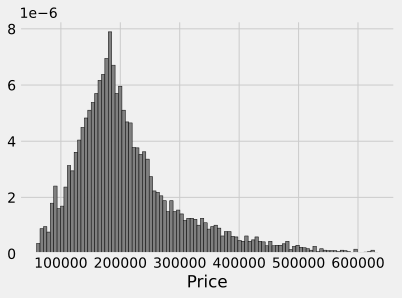

In [41]:
plt.hist(df['Price'], bins=100, ec='black', density=True, color='grey')
plt.xlabel('Price')
plt.show()

Построим график плотности распределения целевой переменной. По виду имеет нормальное распределение со средним значением около 180000$

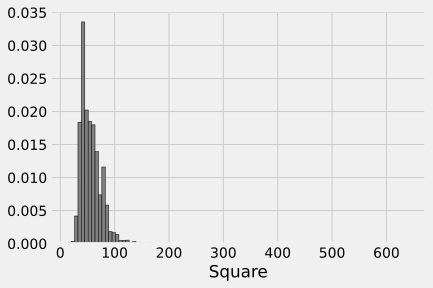

In [42]:
plt.hist(df['Square'], bins=100, ec='black', density=True, color='grey')
plt.xlabel('Square')
plt.show()

Построим плотность распределения по общей площади. Также видим нормальное распределение, причем плотность выше 150 \\( м^2\\) крайне мала. Посмотрим количество квартир с площадью выше 150 \\( м^2\\), а также их плотность распределения.

In [43]:
df.loc[df['Square'] > 150, 'Square'].count()

26

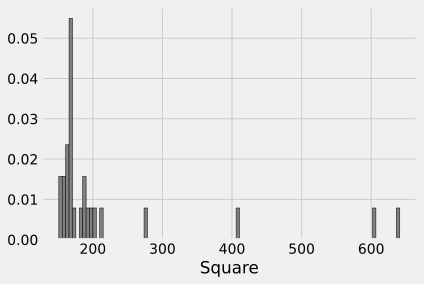

In [44]:
plt.hist(df.loc[df['Square'] > 150, 'Square'], bins=100, ec='black', density=True, color='grey')
plt.xlabel('Square')
plt.show()

Как видно, значения в "хвосте" распределения разрежены и почти не влияют на выборку. Посмотрим распределение до площади 150 \\( м^2\\)

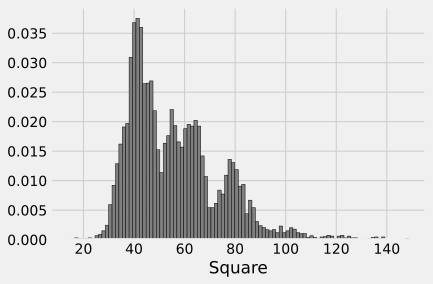

In [45]:
plt.hist(df.loc[df['Square'] < 150, 'Square'], bins=100, ec='black', density=True, color='grey')
plt.xlabel('Square')
plt.show()

В общем распределение имеет вид нормального, но с несколькими пиками. Возможно, эти пики характерны для квартир с разным количеством комнат - 1-й пик для однокомнатных квартир, 2-й - для двухкомнатных и т.д.

Добавим новую целевую переменную - стоимость квадратного метра квартиры, и посмотрим ее распределение

In [46]:
df['Price_1m'] = df['Price'] / df['Square']

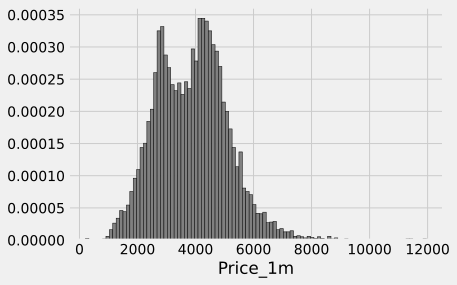

In [47]:
plt.hist(df['Price_1m'], bins=100, ec='black', density=True, color='grey')
plt.xlabel('Price_1m')
plt.show()

Видим два пика у распределения, то есть условно квартиры можно разделить на две категории. Первая категория - квартиры среднего класса со средней стоимостью около 3000$ за метр. Вторая - элитное жилье со средней ценой выше 4000.

Посмотрим среднюю цену за квадратный метр в зависимости от района (DistrictId) в отсортированном виде

In [48]:
df['DistrictId'].value_counts()

27     851
1      652
23     565
6      511
9      294
      ... 
199      1
205      1
174      1
209      1
207      1
Name: DistrictId, Length: 205, dtype: int64

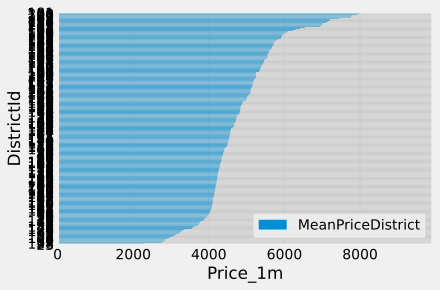

In [49]:
groupby = df.groupby('DistrictId')
tmp = groupby.agg({'Price_1m': 'mean'})
tmp.sort_values(by='Price_1m', inplace=True)
tmp.rename(columns={'Price_1m': 'MeanPriceDistrict'}, inplace=True)

tmp.plot(kind="barh")
plt.xlabel('Price_1m')
plt.ylabel('DistrictId')
plt.show()

На этом графике также видно разное распределение у нескольких категорий жилья - до 4000, от 4000 до 6000 и свыше 6000.  
Сам DistrictId не является информативным параметром, поэтому можно как признак ранжирования районов добавить параметр - средняя цена за квадратный метр по району.

In [50]:
df = pd.merge(df, tmp, on='DistrictId', how='inner')

Оценим визуально корелляцию двух новых признаков

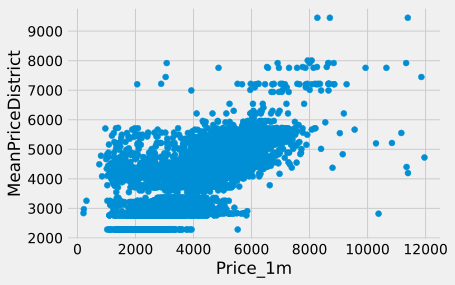

In [51]:
plt.scatter(df['Price_1m'], df['MeanPriceDistrict'])
plt.xlabel('Price_1m')
plt.ylabel('MeanPriceDistrict')
plt.show()

На графике прослеживается некоторая корелляция этих признаков. Также на графике хорошо виден разброс от средней цены по районам.  
Теперь оценим корреляцию между общей площадью и ценой.

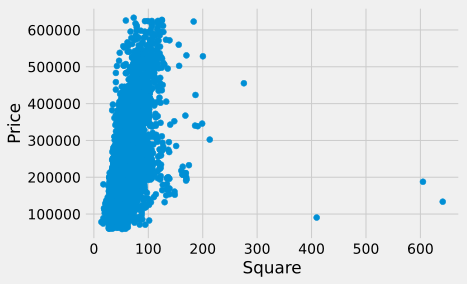

In [52]:
plt.scatter(df['Square'], df['Price'])
plt.xlabel('Square')
plt.ylabel('Price')
plt.show()

По графику видна хорошая корреляция этих двух признаков, но 4 наблюдения явно выбиваются из общей картины.  
Поэтому просто удалим их

In [53]:
df[df['Square'] > 250]

,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Social_1,...,Shops_1,Price,LifeSquareNan,Healthcare_1_Nan,LifeSquare_per_Square,Ecology_2_bin,Ecology_3_bin,Shops_2_bin,Price_1m,MeanPriceDistrict
4242,9,2.0,604.705972,373.335514,1.0,17,18.0,1977,0.161532,25,...,4,187717.242538,1,0,0.617384,0,0,0,310.427301,3255.972211
6754,30,2.0,641.065193,638.163193,10.0,7,13.0,2019,0.000078,22,...,3,133529.681562,0,0,0.995473,0,0,0,208.293451,2837.830748
9423,86,5.0,275.645284,233.949309,26.0,12,37.0,2011,0.161976,31,...,7,455264.882666,0,0,0.848733,0,1,0,1651.633128,4712.326506
9928,102,1.0,409.425181,252.772368,10.0,4,4.0,2016,0.238617,26,...,6,90470.430830,0,0,0.617384,0,0,0,220.969386,2971.094045


In [54]:
df = df.loc[~(df['Square'] > 250)]
df[df['Square'] > 250]

,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Social_1,...,Shops_1,Price,LifeSquareNan,Healthcare_1_Nan,LifeSquare_per_Square,Ecology_2_bin,Ecology_3_bin,Shops_2_bin,Price_1m,MeanPriceDistrict


In [55]:
df.to_csv(PREPARED_DATASET_PATH, index=False, encoding='utf-8', sep=';')

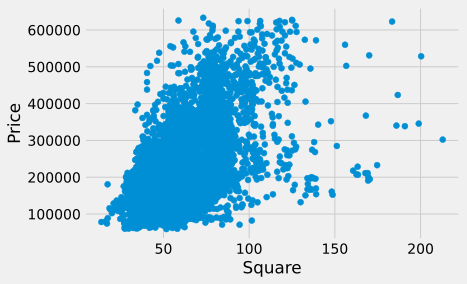

In [56]:
plt.scatter(df['Square'], df['Price'])
plt.xlabel('Square')
plt.ylabel('Price')
plt.show()

Посмотрим распределение комнат, а также совместно распределение общей площади и жилой площади

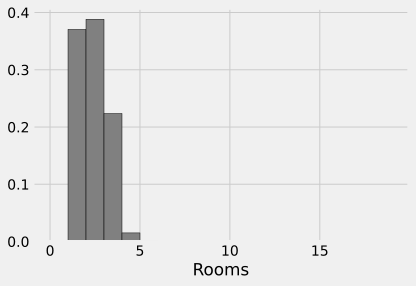

In [57]:
plt.hist(df['Rooms'], bins=19, ec='black', density=True, color='grey')
plt.xlabel('Rooms')
plt.show()

Выводы по распределению комнат - квартиры преимущественно одно- и двухкомнатные

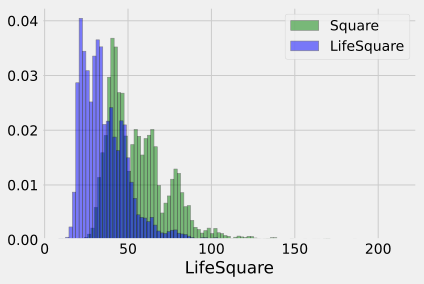

In [58]:
plt.hist(df['Square'], bins=100, alpha=0.5, ec='black', density=True, color='green', label='Square')
plt.hist(df['LifeSquare'], bins=100, alpha=0.5, ec='black', density=True, color='blue', label='LifeSquare')
plt.xlabel('LifeSquare')
plt.legend()
plt.show()

По этому распределению хорошо видно корреляцию между общей и жилой площадью. Графики сдвинуты относительно друг друга, так как жилая площадь меньше общей

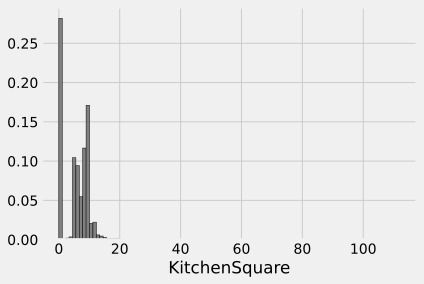

In [59]:
plt.hist(df['KitchenSquare'], bins=100, ec='black', density=True, color='grey')
plt.xlabel('KitchenSquare')
plt.show()

На этом распределении видна большая доля с нулевой площадью кухни. Это, видимо, квартиры-студии

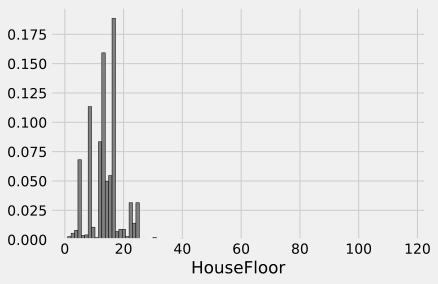

In [60]:
plt.hist(df['HouseFloor'], bins=100, ec='black', density=True, color='grey')
plt.xlabel('HouseFloor')
plt.show()

По распределению этажности дома нельзя определить вид распределения (нормальное, экспоненциальное и т.д.). Это происходит потому, что существуют наиболее популярные этажности у домов в городе - 5, 14, 17 и т.д. Медианное значение - 17 этажей

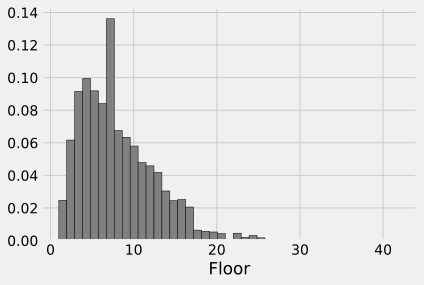

In [61]:
plt.hist(df['Floor'], bins=43, ec='black', density=True, color='grey')
plt.xlabel('Floor')
plt.show()

А вот распределение этажей квартир имеет вид нормального распределения, за исключением выброса на 7-м этаже. К этому выбросу также прибавились исправленные данные, в которых этаж квартиры был выше этажности дома

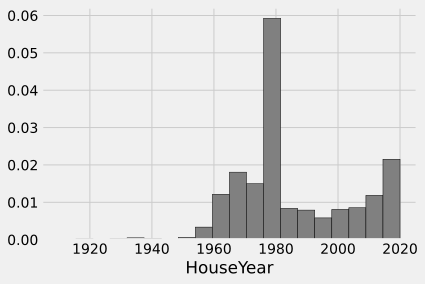

In [62]:
plt.hist(df['HouseYear'], bins=20, ec='black', density=True, color='grey')
plt.xlabel('HouseYear')
plt.show()

По распределению года постройки видно, что наиболее активная застройка производилась в конце 80-х

Посмотрим распределение параметра Ecology_1, а также как оно разбивается при разных значениях Ecology_2 и Ecology_3

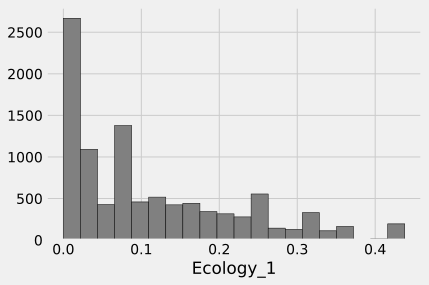

In [63]:
plt.hist(df['Ecology_1'], bins=20, ec='black', color='grey')
plt.xlabel('Ecology_1')
plt.show()

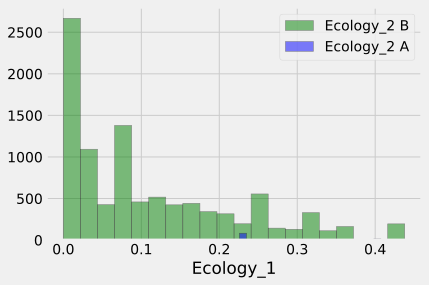

In [64]:
plt.hist(df.loc[df['Ecology_2_bin'] == 0, 'Ecology_1'], bins=20, alpha=0.5, 
         ec='black', color='green', label='Ecology_2 B')
plt.hist(df.loc[df['Ecology_2_bin'] == 1, 'Ecology_1'], bins=20, alpha=0.5, 
         ec='black', color='blue', label='Ecology_2 A')
plt.xlabel('Ecology_1')
plt.legend()
plt.show()

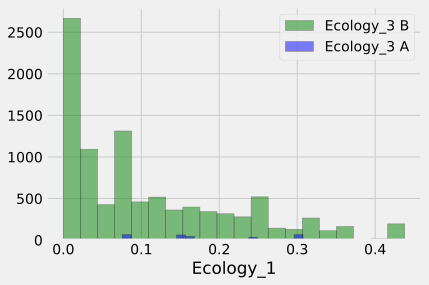

In [65]:
plt.hist(df.loc[df['Ecology_3_bin'] == 0, 'Ecology_1'], bins=20, alpha=0.5, 
         ec='black', color='green', label='Ecology_3 B')
plt.hist(df.loc[df['Ecology_3_bin'] == 1, 'Ecology_1'], bins=20, alpha=0.5, 
         ec='black', color='blue', label='Ecology_3 A')
plt.xlabel('Ecology_1')
plt.legend()
plt.show()

Как видно, показатель Ecology_1 не связан с двумя другими показателями оценки экологии.

Посмотрим 3 социальных признака.

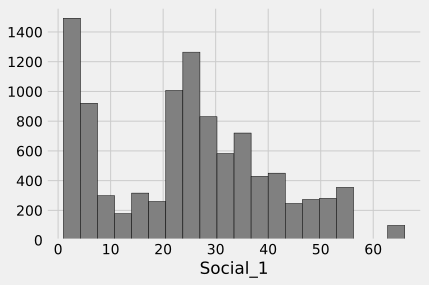

In [66]:
plt.hist(df['Social_1'], bins=20, ec='black', color='grey')
plt.xlabel('Social_1')
plt.show()

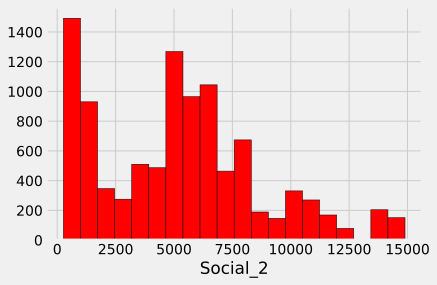

In [67]:
plt.hist(df['Social_2'], bins=20, ec='black', color='red')
plt.xlabel('Social_2')
plt.show()

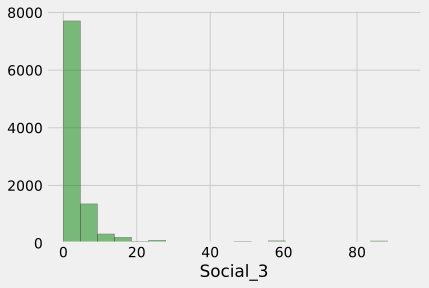

In [68]:
plt.hist(df['Social_3'], bins=20, alpha=0.5, ec='black', color='green')
plt.xlabel('Social_3')
plt.show()

Как видно, распределения первых двух социальных признаков практически совпадают. Оценим их корреляцию на графике

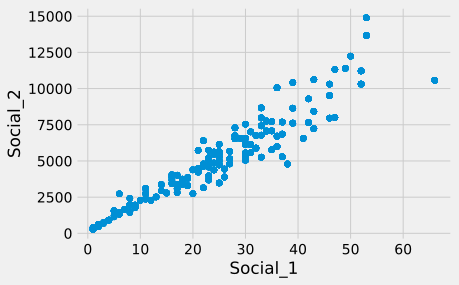

In [69]:
plt.scatter(df['Social_1'], df['Social_2'])
plt.xlabel('Social_1')
plt.ylabel('Social_2')
plt.show()

Видно, что эти два признака очень хорошо коррелируют друг с другом. Оценим корреляцию 3-го признака с одним из первых двух признаков

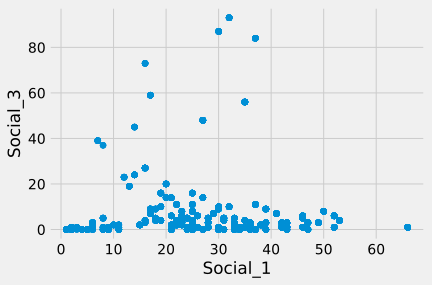

In [70]:
plt.scatter(df['Social_1'], df['Social_3'])
plt.xlabel('Social_1')
plt.ylabel('Social_3')
plt.show()

Видно, что определенная корреляция наблюдается, но имеется слишком много выбросов в середине графика.

Посмотрим 2 параметра здравоохранения.

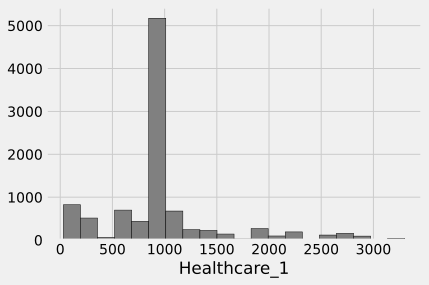

In [71]:
plt.hist(df['Healthcare_1'], bins=20, ec='black', color='grey')
plt.xlabel('Healthcare_1')
plt.show()

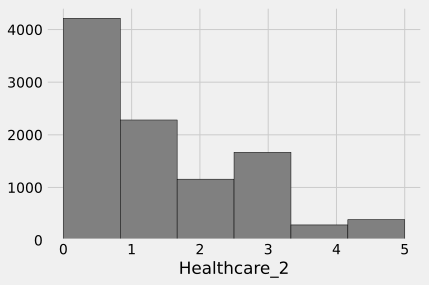

In [72]:
plt.hist(df['Helthcare_2'], bins=6, ec='black', color='grey')
plt.xlabel('Healthcare_2')
plt.show()

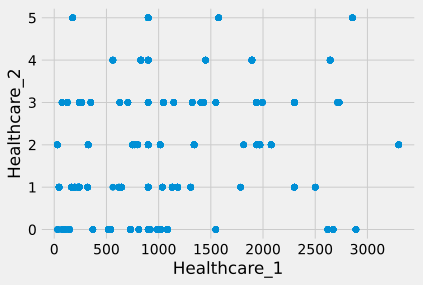

In [73]:
plt.scatter(df['Healthcare_1'], df['Helthcare_2'])
plt.xlabel('Healthcare_1')
plt.ylabel('Healthcare_2')
plt.show()

Как видно по графику, визуально не наблюдается никакой корреляции между этими признаками.

Посмотрим признаки Shops_1 и Shops_2

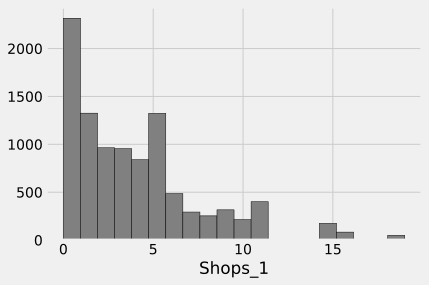

In [74]:
plt.hist(df['Shops_1'], bins=20, ec='black', color='grey')
plt.xlabel('Shops_1')
plt.show()

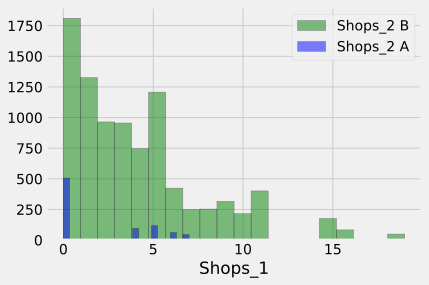

In [75]:
plt.hist(df.loc[df['Shops_2_bin'] == 0, 'Shops_1'], bins=20, alpha=0.5, 
         ec='black', color='green', label='Shops_2 B')
plt.hist(df.loc[df['Shops_2_bin'] == 1, 'Shops_1'], bins=20, alpha=0.5, 
         ec='black', color='blue', label='Shops_2 A')
plt.xlabel('Shops_1')
plt.legend()
plt.show()

По этим двум признакам также не наблюдается какой либо раздельной группировки данных первого признака по второму признаку, значит эти признаки независимы.

Построим итоговую матрицу корреляций.

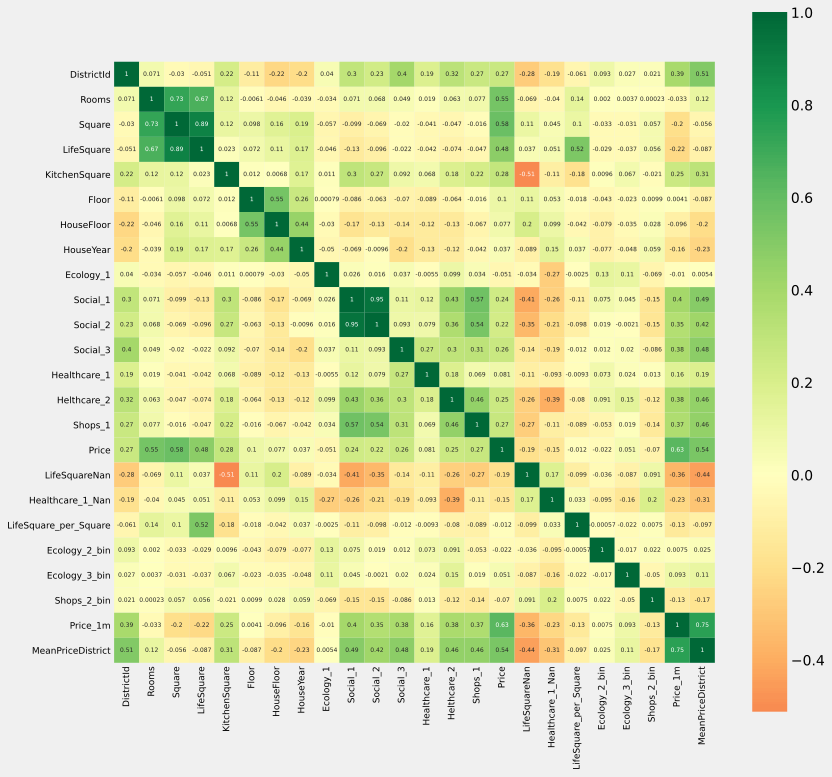

In [84]:
import seaborn as sns
plt.figure(figsize=(12,12))
sns.heatmap(df.corr(), xticklabels=df.corr().columns, yticklabels=df.corr().columns, 
            cmap='RdYlGn', annot=True, annot_kws = { "size" : 6 }, fmt='.2g', square=True, center=0)

plt.xticks(fontsize=9)
plt.yticks(fontsize=9)
plt.show()

Выводы по матрице корреляций:
- Целевой признак коррелируется с показателями общей и жилой площади, количеством комнат, а также с новыми признаками - средней удельной ценой по кварталу и удельной ценой. С инфраструктурными признаками коррелируется плохо, либо не коррелируется вовсе
- Средняя удельная цена по кварталу и удельная цена, напротив, немного коррелируются с инфраструктурными признаками. Также они коррелируются между собой
- Среди признаков, не коррелирующихся с целевым, есть признаки, коррелирующие между собой. Например, Social_1 и Shops_1